# Simple event plotting of CNN mPMT dataset

In [1]:
%load_ext autoreload
%matplotlib inline
%autoreload 2

In [2]:
import sys
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt

In [3]:
print(os.getcwd())
sys.path.append('/home/nprouse/WatChMaL/WatChMaL_analysis/')
sys.path.append('/home/nprouse/WatChMaL/WatChMaL_analysis/WatChMaL')

/home/nprouse/WatChMaL/WatChMaL_analysis/event_plotting


In [4]:
from watchmal.dataset.cnn_mpmt.cnn_mpmt_dataset import CNNmPMTDataset

In [5]:
def channel_to_position(channel):
    channel = channel % 19 
    theta = (channel<12)*2*np.pi*channel/12 + ((channel >= 12) & (channel<18))*2*np.pi*(channel-12)/6
    radius = 0.2*(channel<18)+0.2*(channel<12)
    position = [radius*np.cos(theta), radius*np.sin(theta)] # note this is [y, x] or [row, column]
    return position

In [6]:
def plot_event(data, mpmt_pos, old_convention=False, **plot_args):
    fig = plt.figure(figsize=(20,12))
    ax = fig.add_subplot(111)
    mpmts = ax.scatter(mpmt_pos[:, 1], mpmt_pos[:, 0], s=380, facecolors='none', edgecolors='0.9')
    indices = np.indices(data.shape)
    channels = indices[0].flatten()
    positions = indices[1:].reshape(2,-1).astype(np.float64)
    positions += channel_to_position(channels)
    if old_convention:
        positions[1] = max(mpmt_pos[:, 1])-positions[1]
    pmts = ax.scatter(positions[1], positions[0], c=data.flatten(), s=3, **plot_args)
    plt.colorbar(pmts)

## Testing with short tank data

### Loading data and plotting test event

In [7]:
dataset_short = CNNmPMTDataset(h5file='/fast_scratch/WatChMaL/data/IWCD_mPMT_Short_emg_E0to1000MeV_digihits.h5',
                         mpmt_positions_file='/data/WatChMaL/data/IWCDshort_mPMT_image_positions.npz',
                         is_distributed=False)

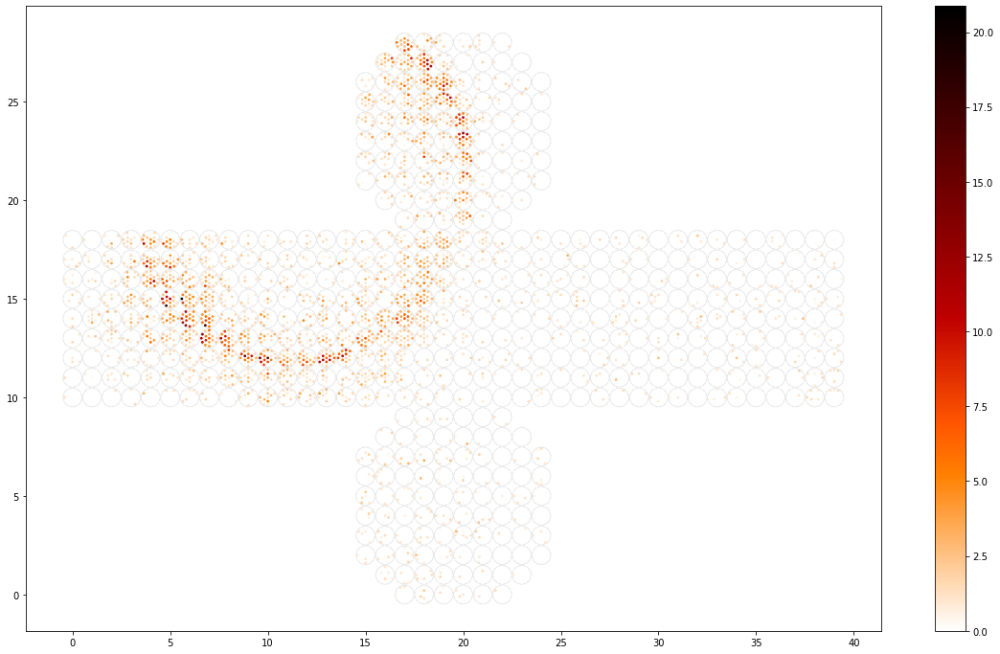

In [8]:
data_short = dataset_short.__getitem__(8)['data']
plot_event(data_short, dataset_short.mpmt_positions, cmap=plt.cm.gist_heat_r)

### Test plots of x, y and z position values of each PMT

In [9]:
geo_file_short = np.load("/fast_scratch/WatChMaL/data/geo_mPMTshort.npz", 'r')
geo_positions_short = geo_file_short["position"]
pmt_ids_short = np.arange(geo_positions_short.shape[0])
data_x_short = dataset_short.process_data(pmt_ids_short, geo_positions_short[:,0])
data_y_short = dataset_short.process_data(pmt_ids_short, geo_positions_short[:,1])
data_z_short = dataset_short.process_data(pmt_ids_short, geo_positions_short[:,2])

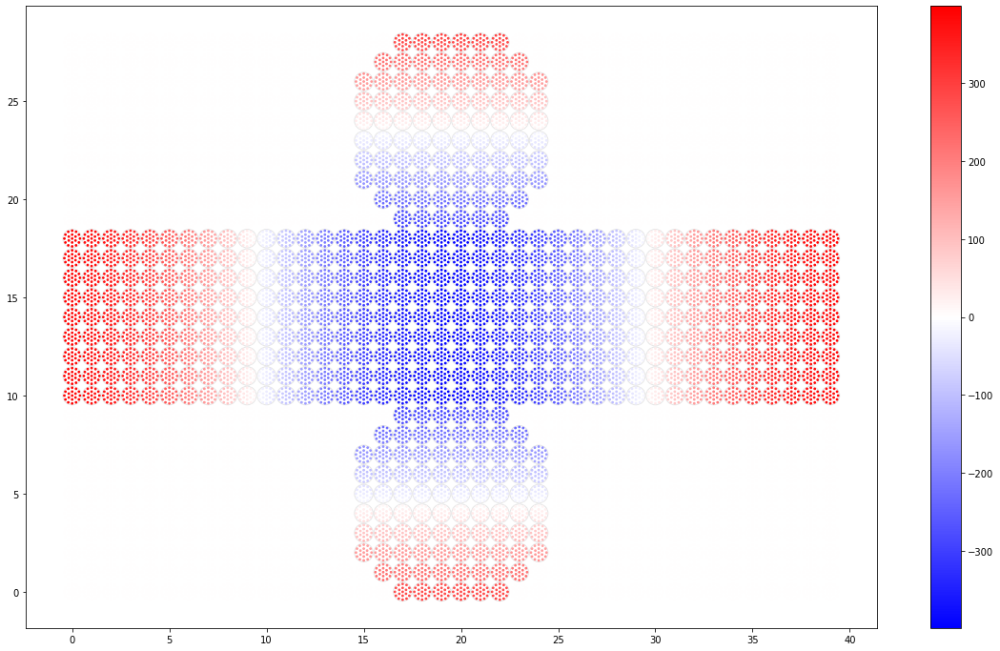

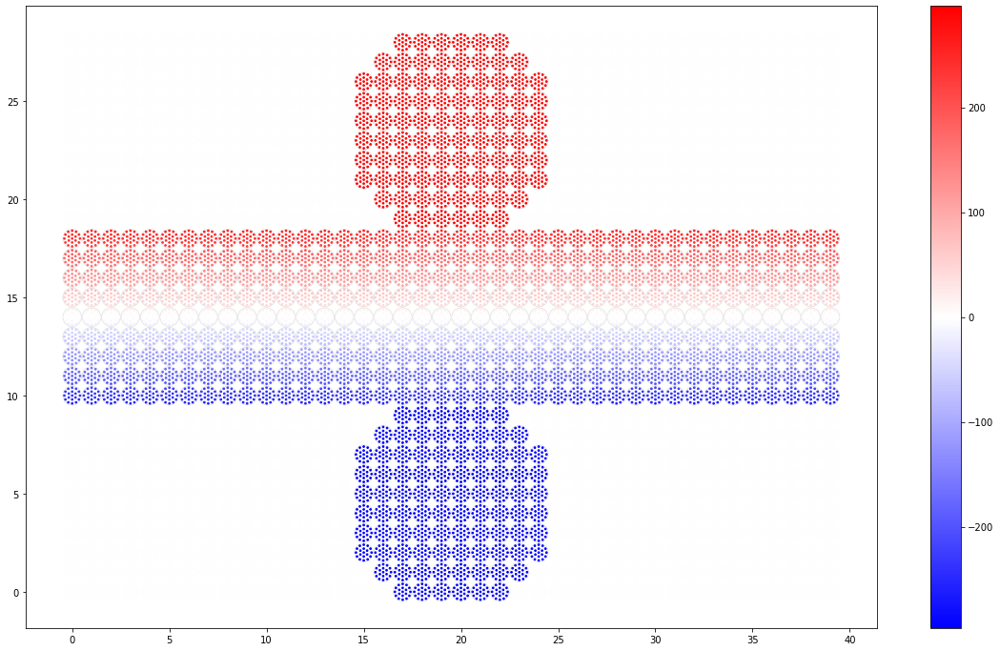

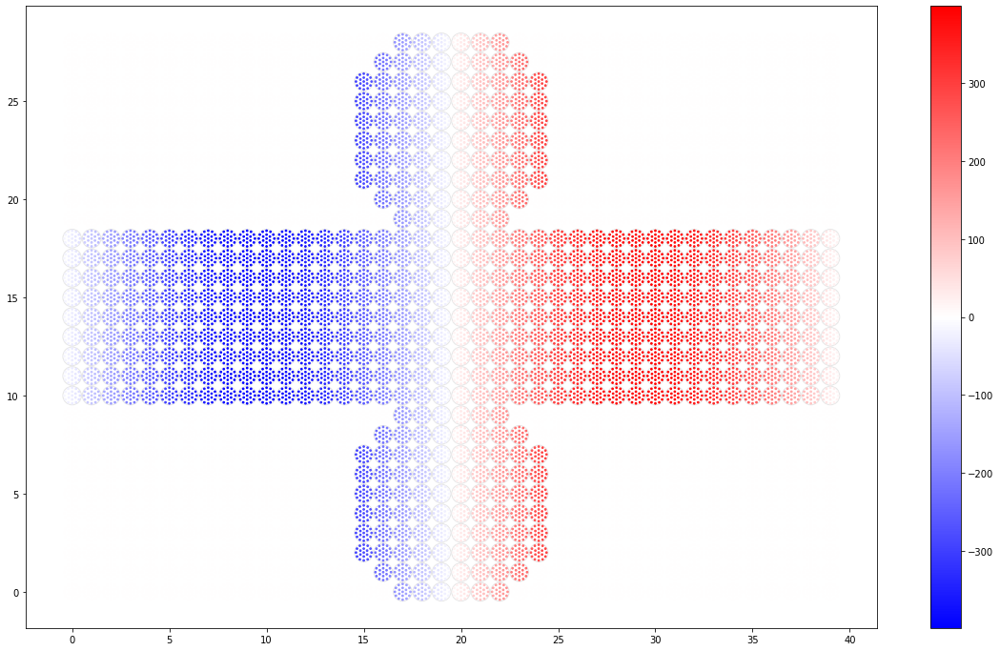

In [10]:
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_x_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_y_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_z_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)

### Test plots of x, y and z positions of each PMT relative to central PMT of the mPMT module

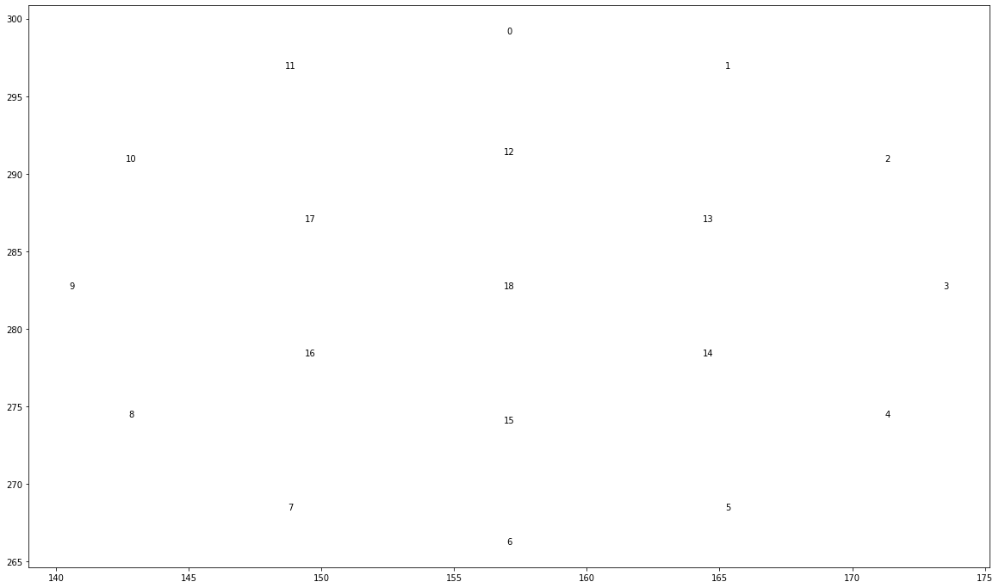

In [11]:
fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111)
ax.scatter(geo_positions_short[-19:,2],geo_positions_short[-19:,0], alpha=0)
for i, pos in zip(pmt_ids_short[-19:], geo_positions_short[-19:]):
    ax.text(pos[2],pos[0],i%19, ha="center", va="center")

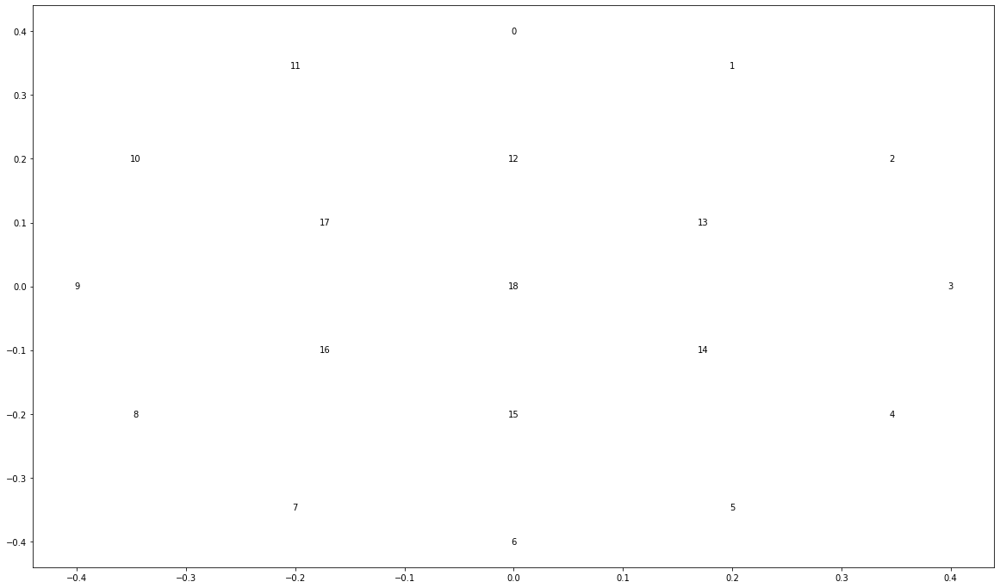

In [12]:
fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111)
test_positions_short = np.array(channel_to_position(pmt_ids_short[-19:])).T
ax.scatter(test_positions_short[:,1], test_positions_short[:,0], alpha=0)
for i, pos in zip(pmt_ids_short[-19:], test_positions_short):
    ax.text(pos[1],pos[0],i%19, ha="center", va="center")

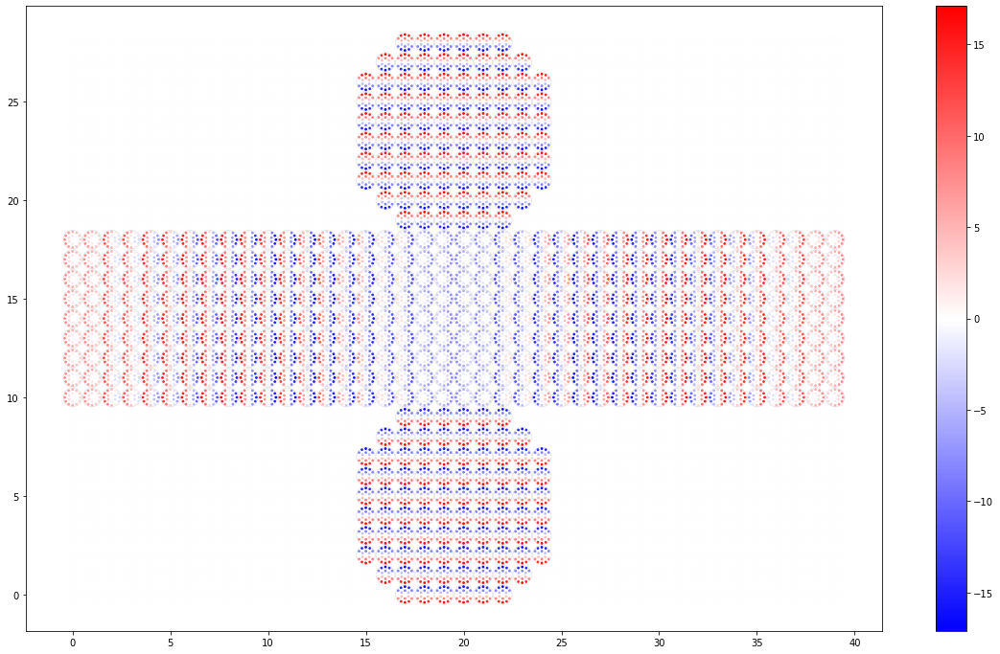

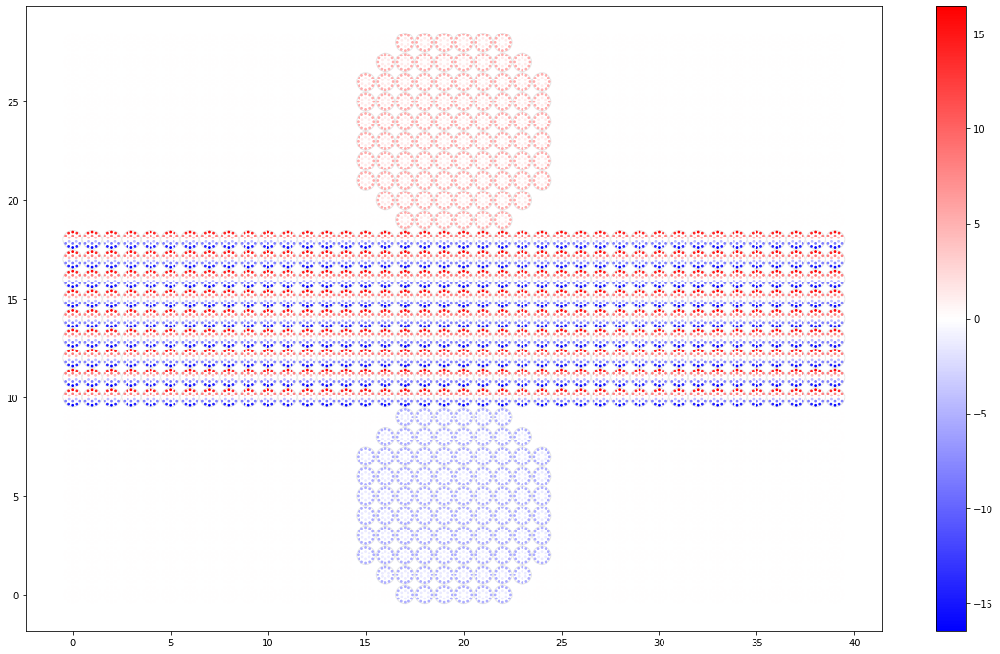

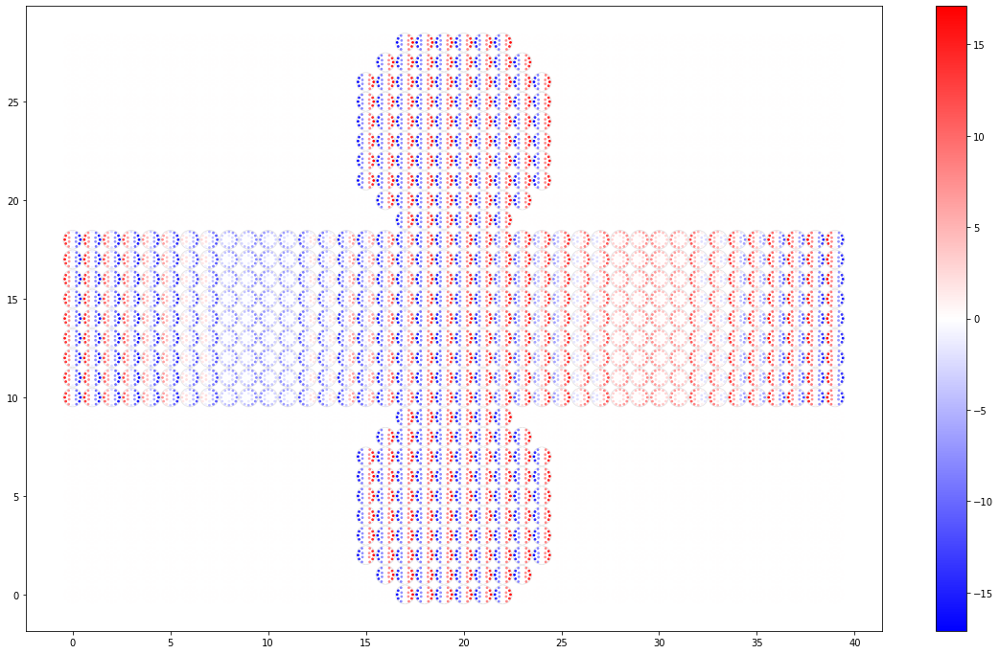

In [13]:
geo_positions_offset_short = geo_positions_short[pmt_ids_short] - geo_positions_short[(pmt_ids_short//19)*19+18]
data_x_short = dataset_short.process_data(pmt_ids_short, geo_positions_offset_short[:,0])
data_y_short = dataset_short.process_data(pmt_ids_short, geo_positions_offset_short[:,1])
data_z_short = dataset_short.process_data(pmt_ids_short, geo_positions_offset_short[:,2])
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_x_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_y_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_z_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)

### Test plots of x, y and z orientation values of each PMT

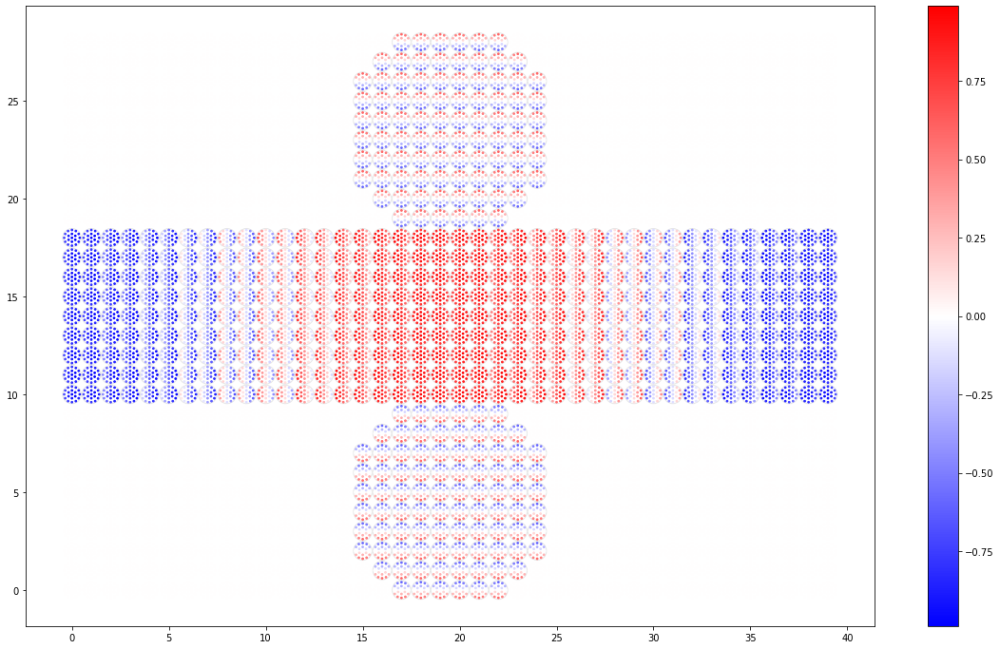

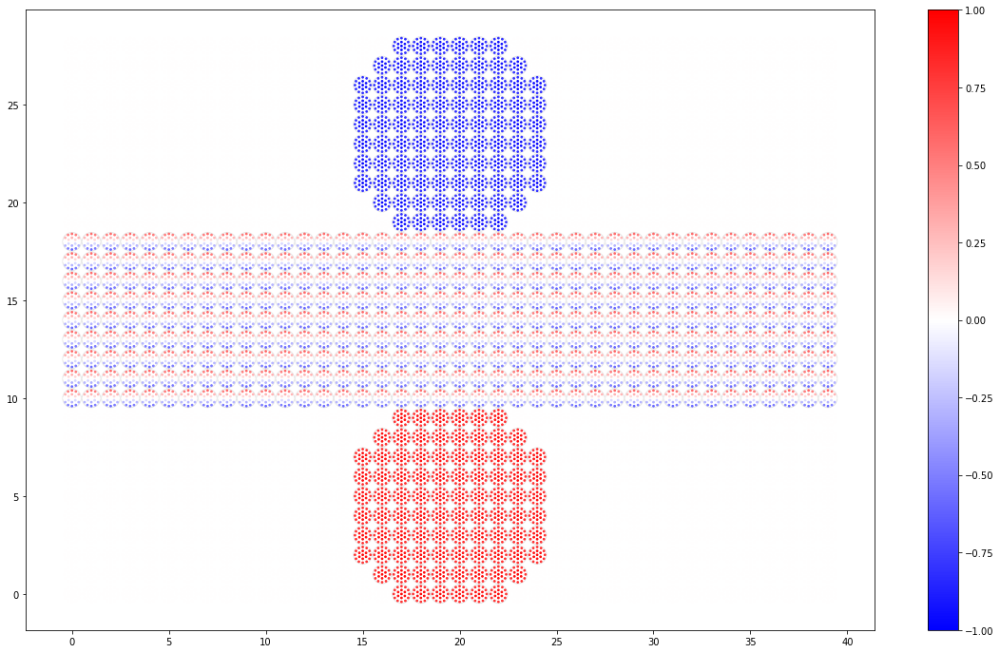

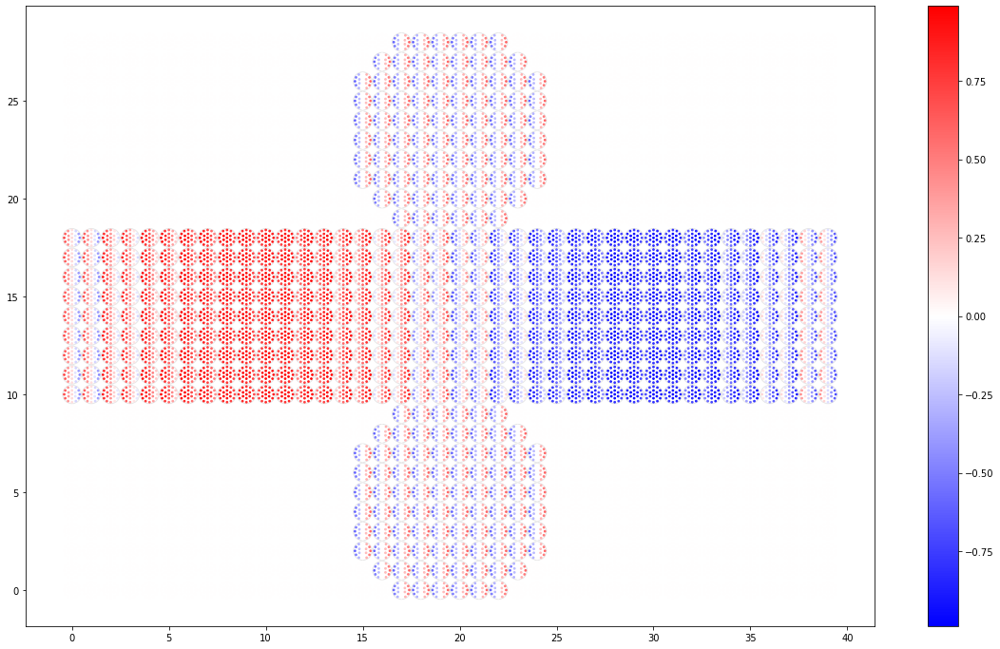

In [14]:
geo_orientations_short = geo_file_short["orientation"]
data_ox_short = dataset_short.process_data(pmt_ids_short, geo_orientations_short[:,0])
data_oy_short = dataset_short.process_data(pmt_ids_short, geo_orientations_short[:,1])
data_oz_short = dataset_short.process_data(pmt_ids_short, geo_orientations_short[:,2])
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_ox_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_oy_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)
plot_event(data_oz_short, dataset_short.mpmt_positions, cmap=plt.cm.bwr)

## Testing with long tank data

### Loading data and plotting test event

In [15]:
dataset_long = CNNmPMTDataset(h5file='/fast_scratch/WatChMaL/data/IWCDmPMT_4pi_full_tank_pointnet.h5',
                         mpmt_positions_file='/data/WatChMaL/data/IWCD_mPMT_image_positions.npz',
                         is_distributed=False)

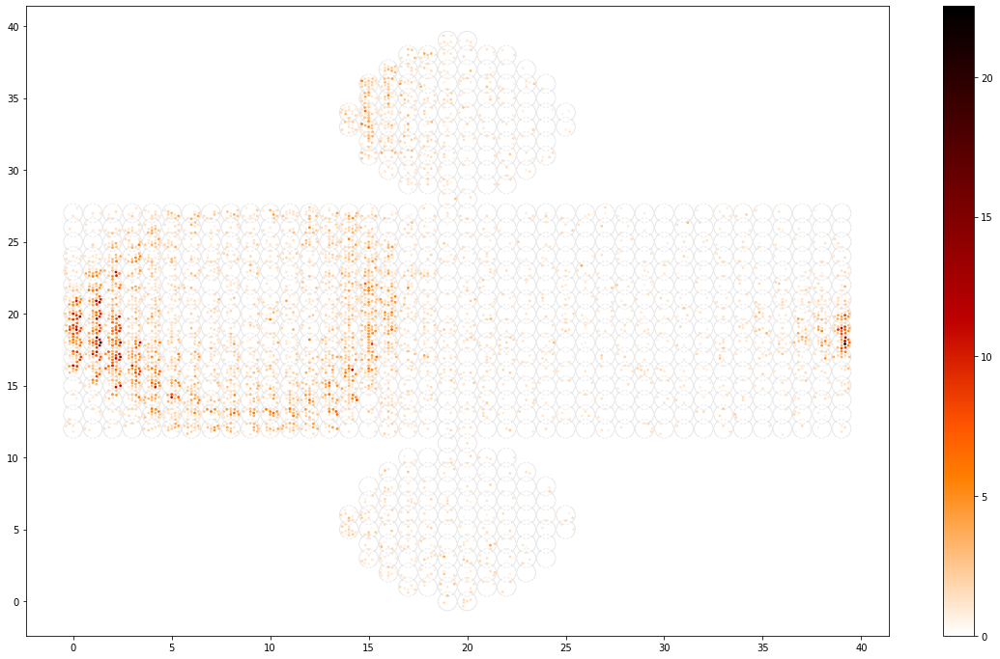

In [16]:
data_long = dataset_long.__getitem__(5)['data']
plot_event(data_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.gist_heat_r)

### Test plots of x, y and z position values of each PMT

In [17]:
geo_file_long = np.load("/fast_scratch/WatChMaL/data/mPMT_full_geo.npz", 'r')
geo_positions_long = geo_file_long["position"]
pmt_ids_long = np.arange(geo_positions_long.shape[0])
data_x_long = dataset_long.process_data(pmt_ids_long, geo_positions_long[:,0])
data_y_long = dataset_long.process_data(pmt_ids_long, geo_positions_long[:,1])
data_z_long = dataset_long.process_data(pmt_ids_long, geo_positions_long[:,2])

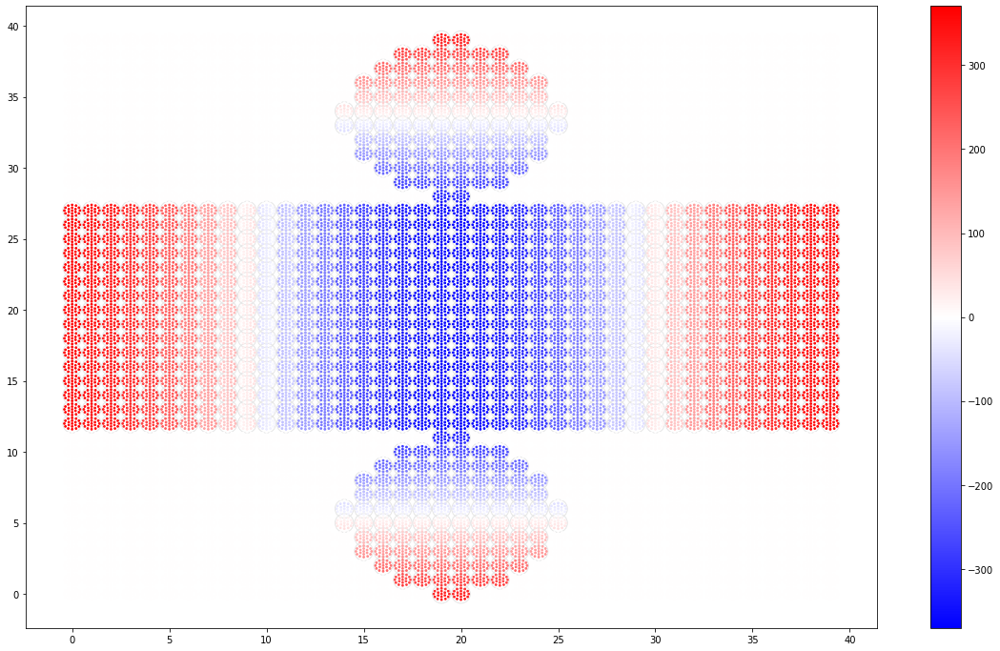

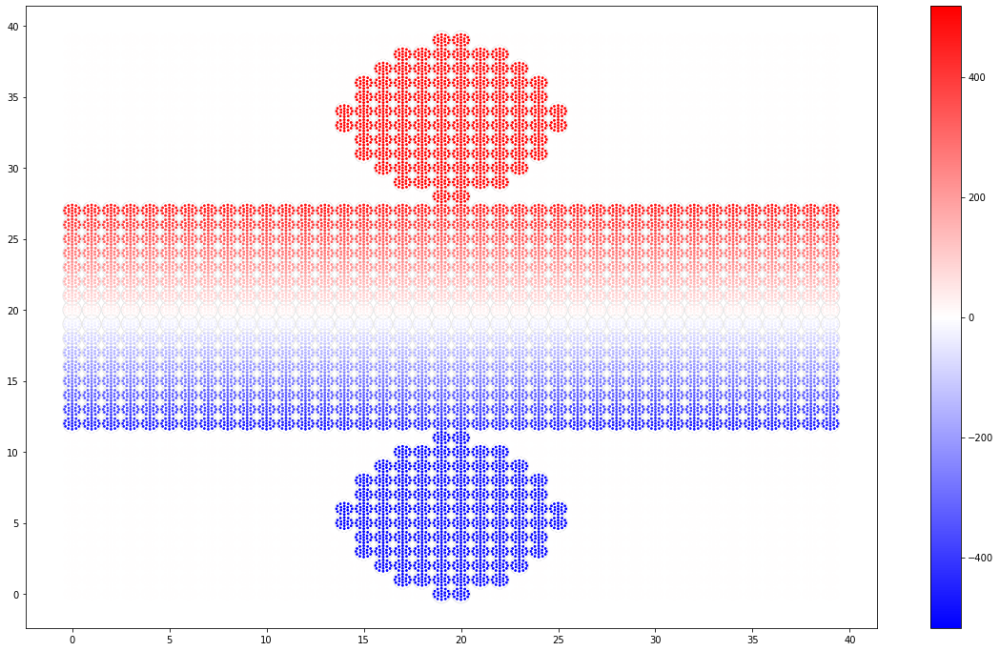

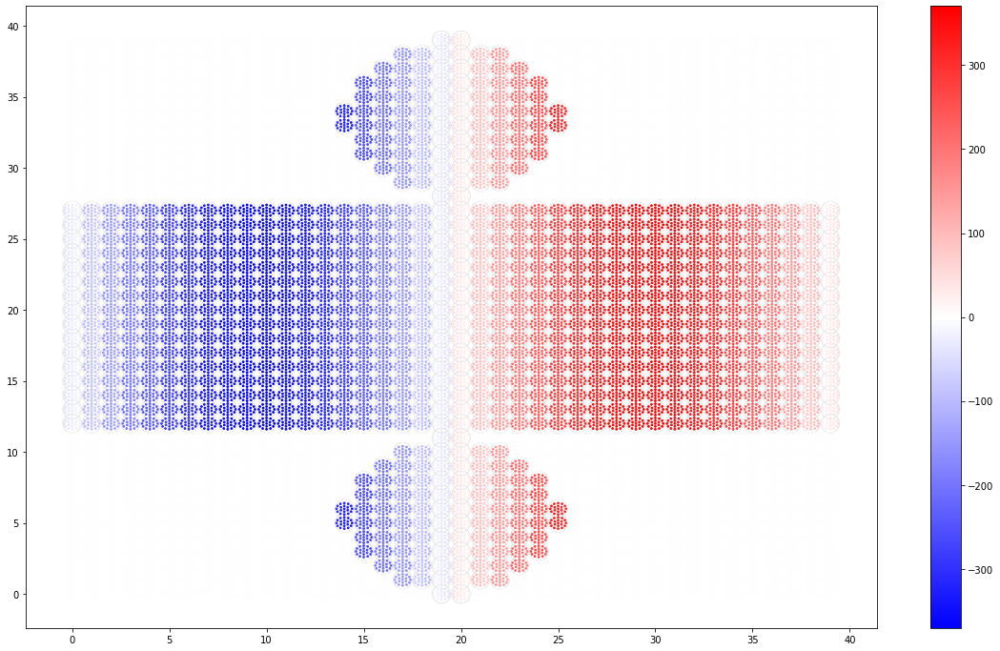

In [18]:
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_x_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_y_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_z_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)

### Test plots of x, y and z positions of each PMT relative to central PMT of the mPMT module

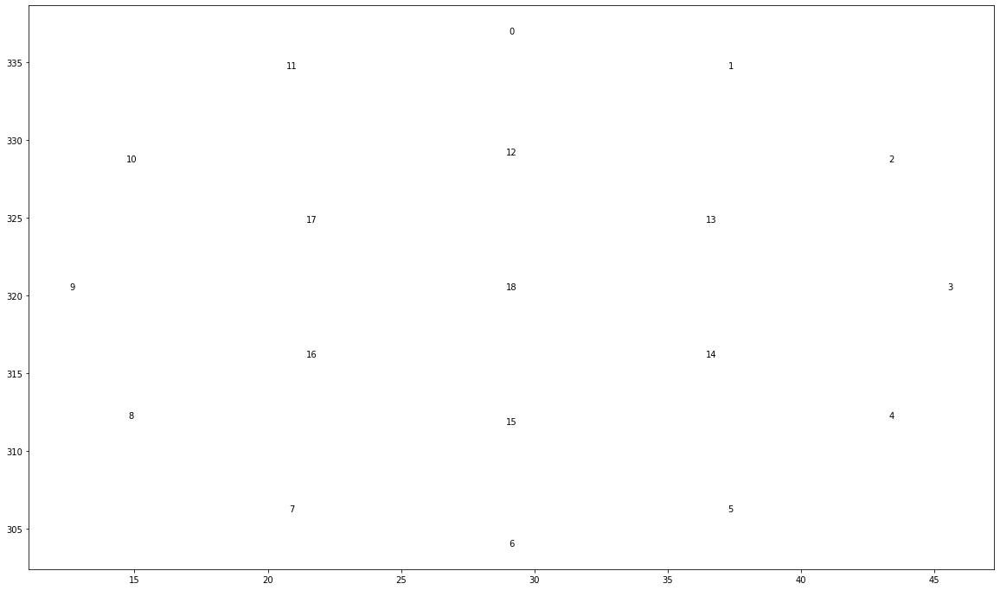

In [23]:
fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111)
ax.scatter(geo_positions_long[-19:,2],geo_positions_long[-19:,0], alpha=0)
for i, pos in zip(pmt_ids_long[-19:], geo_positions_long[-19:]):
    ax.text(pos[2],pos[0],i%19, ha="center", va="center")

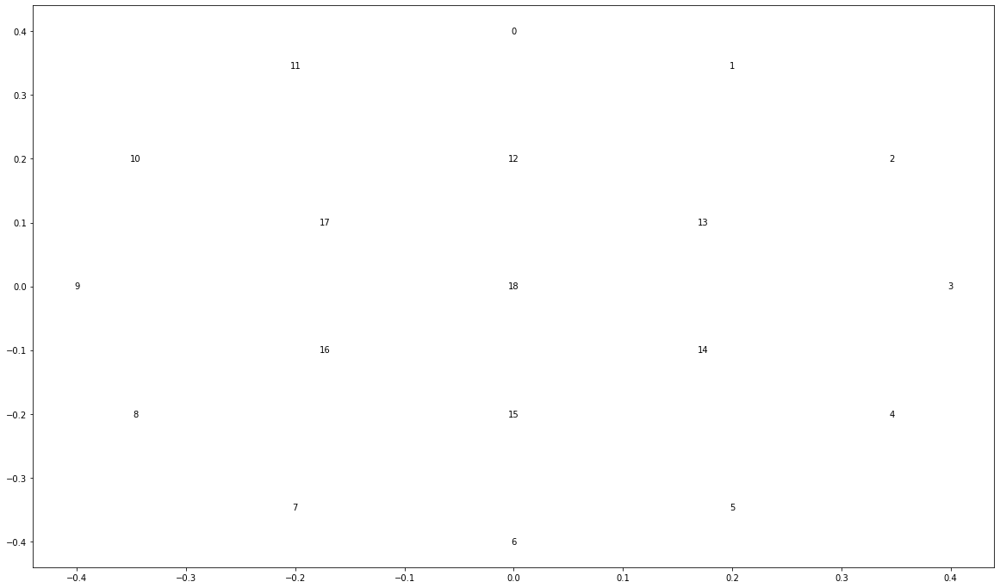

In [20]:
fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111)
test_positions_long = np.array(channel_to_position(pmt_ids_long[-19:])).T
ax.scatter(test_positions_long[:,1], test_positions_long[:,0], alpha=0)
for i, pos in zip(pmt_ids_long[-19:], test_positions_long):
    ax.text(pos[1],pos[0],i%19, ha="center", va="center")

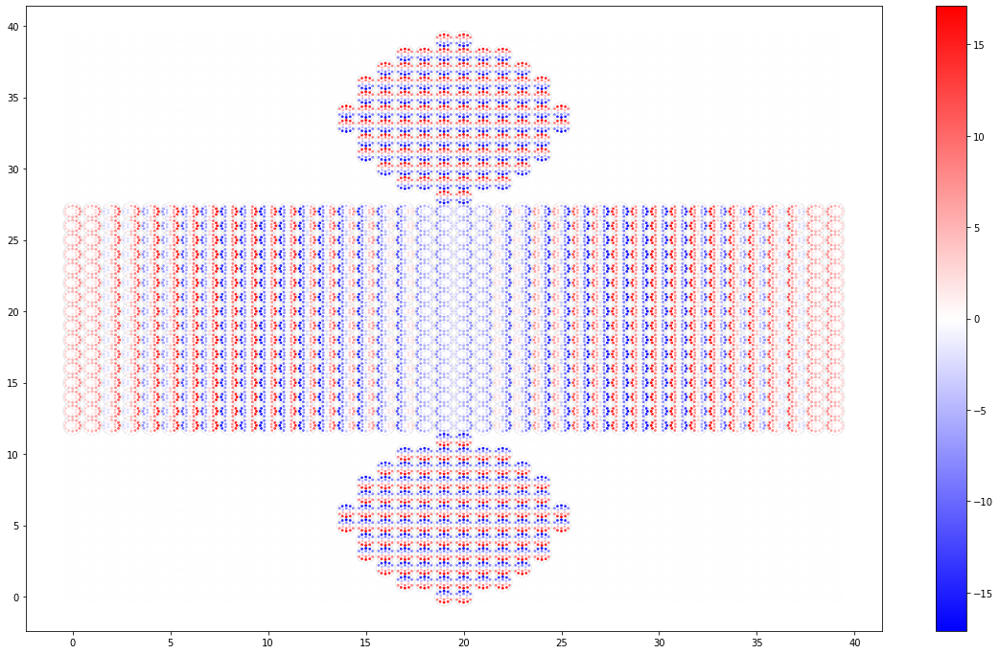

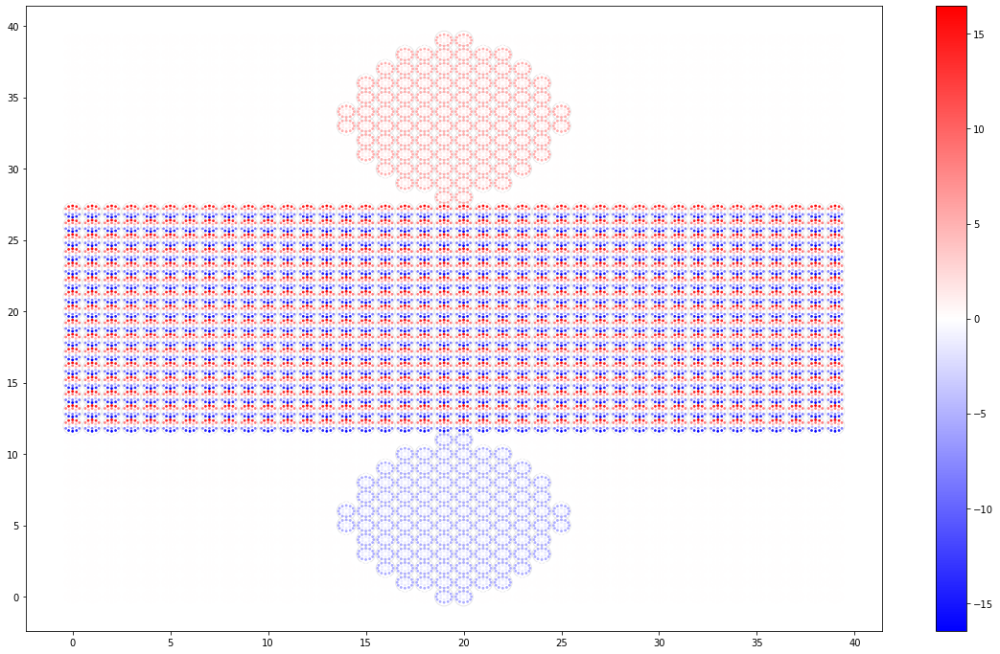

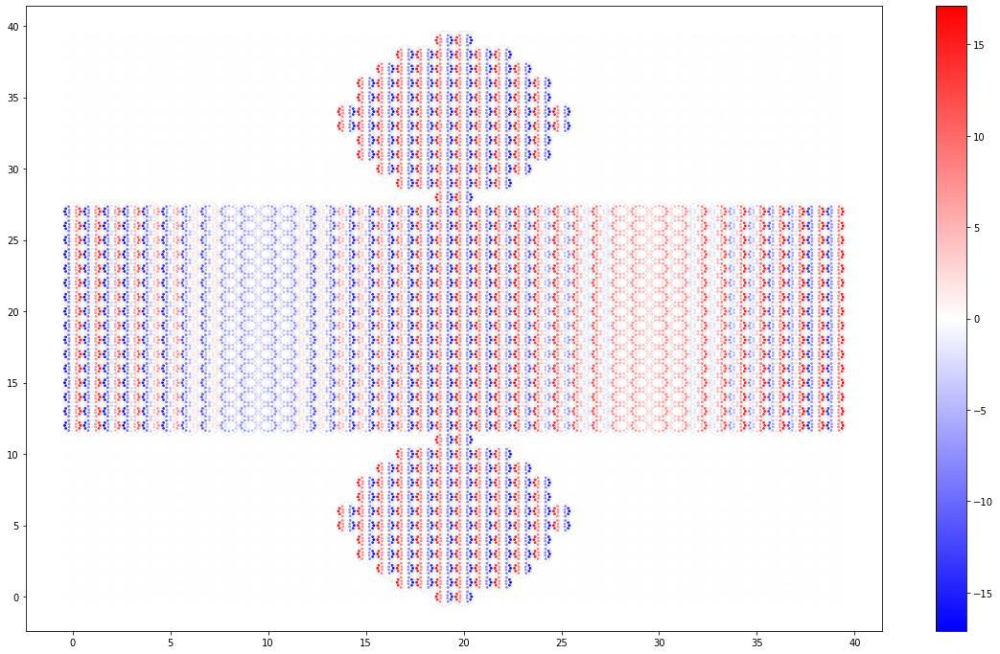

In [21]:
geo_positions_offset_long = geo_positions_long[pmt_ids_long] - geo_positions_long[(pmt_ids_long//19)*19+18]
data_x_long = dataset_long.process_data(pmt_ids_long, geo_positions_offset_long[:,0])
data_y_long = dataset_long.process_data(pmt_ids_long, geo_positions_offset_long[:,1])
data_z_long = dataset_long.process_data(pmt_ids_long, geo_positions_offset_long[:,2])
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_x_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_y_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_z_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)

### Test plots of x, y and z orientation values of each PMT

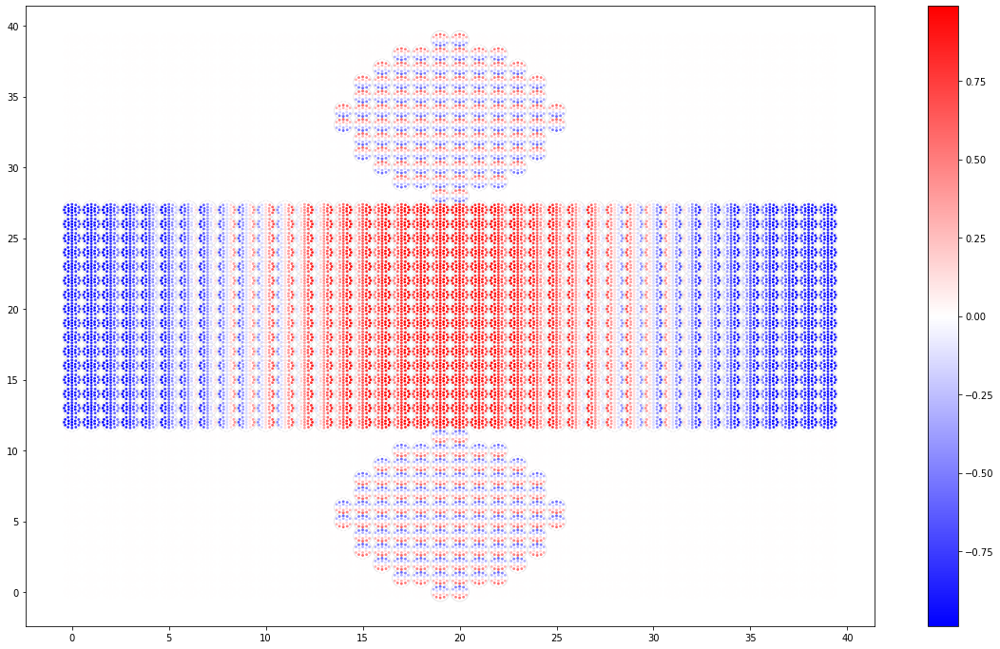

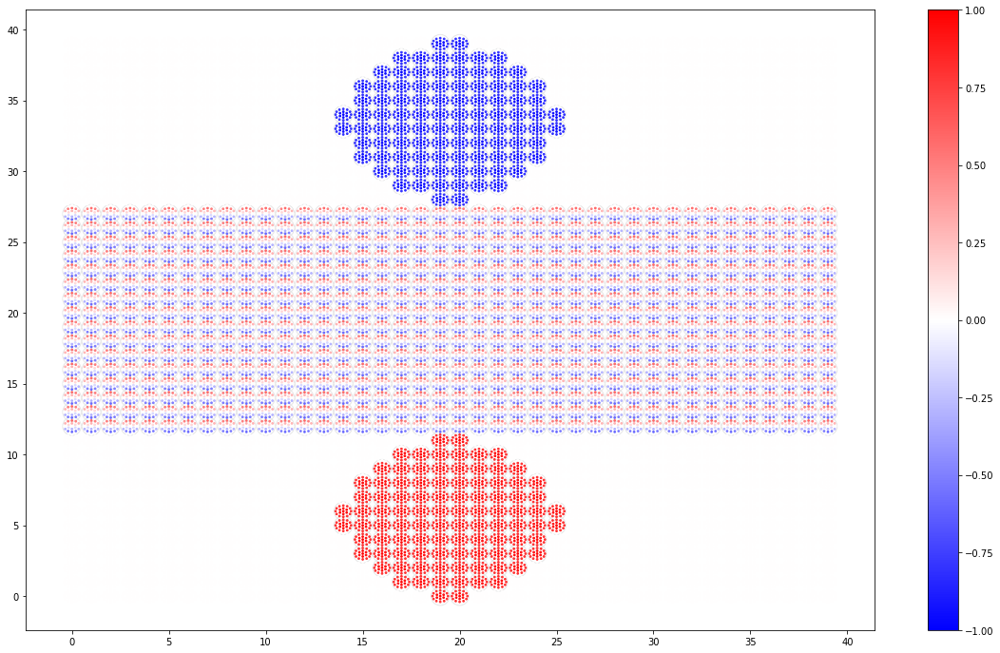

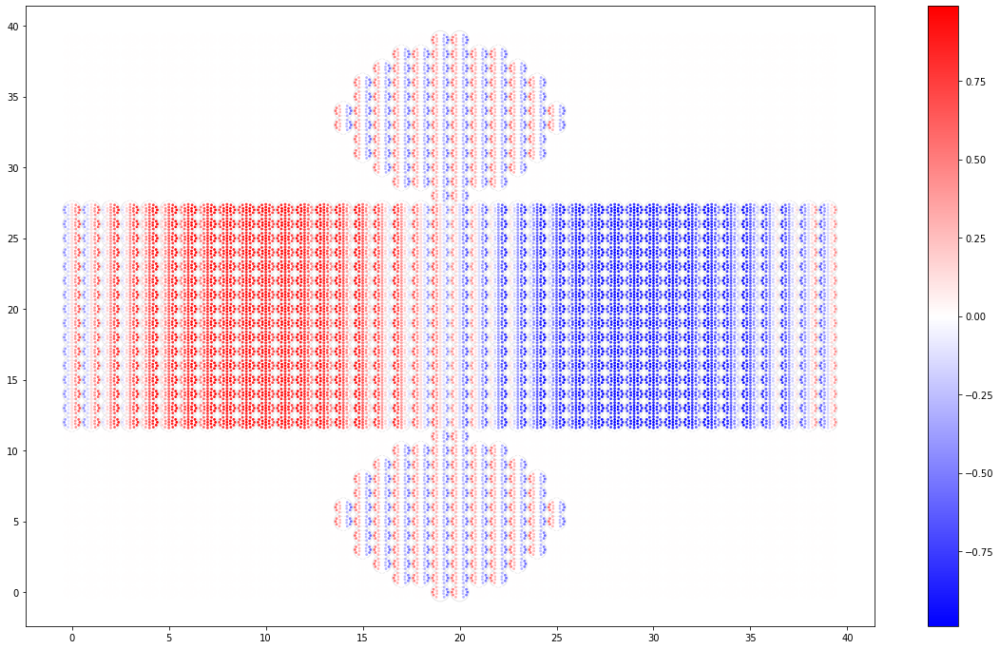

In [22]:
geo_orientations_long = geo_file_long["orientation"]
data_ox_long = dataset_long.process_data(pmt_ids_long, geo_orientations_long[:,0])
data_oy_long = dataset_long.process_data(pmt_ids_long, geo_orientations_long[:,1])
data_oz_long = dataset_long.process_data(pmt_ids_long, geo_orientations_long[:,2])
# use color map with zero set to white so that non-physical mPMT locations don't show
plot_event(data_ox_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_oy_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)
plot_event(data_oz_long, dataset_long.mpmt_positions, old_convention=True, cmap=plt.cm.bwr)